# Analisis Exploratorio de Datos - EDA

In [1]:
#Importamos las librerias necesarias
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import ydata_profiling
from ydata_profiling import ProfileReport
import missingno as msno
import sweetviz as sv
import plotnine as pn
import wordcloud
from wordcloud import WordCloud

%matplotlib inline
%config IPCompleter.greedy=True

# Importacion del dataset

In [2]:
#Importamos el dataframe.
archivo = pd.read_csv(r"C:\Users\miche\OneDrive\Escritorio\Proyecto_MLOps\DataSets\dataframe_final.csv", parse_dates=["release_date"], thousands=".")
df = pd.DataFrame(archivo)

* Estadisticas generales del Dataset.
    * head
    * info
    * describe > media, moda, mediana, max, min, std
    * nunique

In [3]:
#Mostramos las primeras filas del dataframe para ver que la importacion fue existosa y no tenga errores de carga.
df.head(2)

,id_collection,name_collection,budget,id_genres,name_genres,id,original_language,overview,popularity,id_production_companies,...,revenue,runtime,name_spoken_languages,status,tagline,title,vote_average,vote_count,cast,director
0,10194.0,Toy Story Collection,300000000,"[16, 35, 10751]","['Animation', 'Comedy', 'Family']",862,en,"Led by Woody, Andy's toys live happily in his ...",21946943.0,[3],...,3735540330,810.0,['English'],Released,NaN,Toy Story,77,54150,"['Tom Hanks', 'Tim Allen', 'Don Rickles', 'Jim...",['John Lasseter']
1,NaN,NaN,650000000,"[12, 14, 10751]","['Adventure', 'Fantasy', 'Family']",8844,en,When siblings Judy and Peter discover an encha...,17015539.0,"[559, 2550, 10201]",...,2627972490,1040.0,"['English', 'Français']",Released,Roll the dice and unleash the excitement!,Jumanji,69,24130,"['Robin Williams', 'Jonathan Hyde', 'Kirsten D...",['Joe Johnston']


In [4]:
#Mostramos la informacion del dataframe en base a columnas y los tipos de datos.
df.info()

#Problema: Varias columnas tienen un dtype errado.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45345 entries, 0 to 45344
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   id_collection              4485 non-null   float64       
 1   name_collection            4485 non-null   object        
 2   budget                     45345 non-null  int64         
 3   id_genres                  42962 non-null  object        
 4   name_genres                42962 non-null  object        
 5   id                         45345 non-null  int64         
 6   original_language          45334 non-null  object        
 7   overview                   44404 non-null  object        
 8   popularity                 45345 non-null  float64       
 9   id_production_companies    33557 non-null  object        
 10  name_production_companies  33557 non-null  object        
 11  name_production_countries  39138 non-null  object        
 12  rele

In [5]:
#Verificamos estadisticas descriptivas basicas.
df.describe()

#Insight: Podemos observar que tenemos valores atipicos en popularity y runtime. (posiblemente en vote_count, esto se sabra mas adelante por medio de un boxplot.)

,id_collection,budget,id,popularity,release_year,return,revenue,runtime,vote_average,vote_count
count,4485.000000,4.534500e+04,45345.000000,4.534500e+04,45345.000000,4.534500e+04,4.534500e+04,45099.000000,45345.000000,45345.000000
mean,184146.038796,4.232673e+07,108035.740479,2.661395e+06,1991.882280,9.451850e+14,1.123390e+08,941.798931,56.243202,1101.377219
std,141641.931911,1.744391e+08,112180.079341,5.865177e+06,24.053016,4.702947e+15,6.441058e+08,383.466360,19.151780,4919.044285
min,10.000000,0.000000e+00,2.000000,0.000000e+00,1874.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000
25%,86027.000000,0.000000e+00,26390.000000,2.669070e+05,1978.000000,0.000000e+00,0.000000e+00,850.000000,50.000000,30.000000
50%,141615.000000,0.000000e+00,59852.000000,9.531520e+05,2001.000000,0.000000e+00,0.000000e+00,950.000000,60.000000,100.000000
75%,294172.000000,0.000000e+00,156597.000000,3.117495e+06,2010.000000,0.000000e+00,0.000000e+00,1070.000000,68.000000,340.000000
max,480160.000000,3.800000e+09,469172.000000,5.474883e+08,2020.000000,7.971429e+16,2.787965e+10,12560.000000,100.000000,140750.000000


In [6]:
#Verificamos los valores unicos.
df.nunique().sort_values(ascending=False)

id                           45345
overview                     44231
popularity                   43576
cast                         42656
title                        42195
id_production_companies      22702
name_production_companies    22667
tagline                      20269
director                     18829
release_date                 17333
revenue                       6863
return                        5201
name_genres                   4064
id_genres                     4064
name_production_countries     2388
name_spoken_languages         1842
vote_count                    1820
id_collection                 1695
name_collection               1695
budget                        1223
runtime                        353
release_year                   135
vote_average                    92
original_language               89
release_month                   12
release_day                      7
status                           6
dtype: int64

* Replace de ingles a español en las variables release_day y release_month

In [7]:
#df.release_day
df.release_day = df.release_day.str.replace("Monday", "Lunes")
df.release_day = df.release_day.str.replace("Tuesday", "Martes")
df.release_day = df.release_day.str.replace("Wednesday", "Miercoles")
df.release_day = df.release_day.str.replace("Thursday", "Jueves")
df.release_day = df.release_day.str.replace("Friday", "Viernes")
df.release_day = df.release_day.str.replace("Saturday", "Sabado")
df.release_day = df.release_day.str.replace("Sunday", "Domingo")

#df.release_month
df.release_month = df.release_month.str.replace("January", "Enero")
df.release_month = df.release_month.str.replace("February", "Febrero")
df.release_month = df.release_month.str.replace("March", "Marzo")
df.release_month = df.release_month.str.replace("April", "Abril")
df.release_month = df.release_month.str.replace("May", "Mayo")
df.release_month = df.release_month.str.replace("June", "Junio")
df.release_month = df.release_month.str.replace("July", "Julio")
df.release_month = df.release_month.str.replace("August", "Agosto")
df.release_month = df.release_month.str.replace("September", "Septiembre")
df.release_month = df.release_month.str.replace("October", "Octubre")
df.release_month = df.release_month.str.replace("November", "Noviembre")
df.release_month = df.release_month.str.replace("December", "Diciembre")

# Verificacion de Nulos / Faltantes

In [8]:
#Verificamos la cantidad de nulos en numeros.
df.isnull().sum().sort_values(ascending=False)

id_collection                40860
name_collection              40860
tagline                      24958
id_production_companies      11788
name_production_companies    11788
name_production_countries     6207
name_spoken_languages         3765
name_genres                   2383
id_genres                     2383
cast                          2348
overview                       941
runtime                        246
status                          80
original_language               11
vote_count                       0
title                            0
vote_average                     0
release_year                     0
revenue                          0
release_day                      0
return                           0
release_month                    0
release_date                     0
popularity                       0
id                               0
budget                           0
director                         0
dtype: int64

In [9]:
#Verificamos la cantidad de nulos en porcentajes.
df.isnull().sum().sort_values(ascending=False)/len(df)

#Problema: Obtenemos una gran cantidad de nulos de las columnas id_collection, name_collection, tag_line, id_production_companies, name_production_companies. 
# Las cuales tienen un minimo de 25% de datos nulos en sus respectivas columnas.

#Solucion: Borrar todas las filas que tengan un minimo de 25% de datos faltantes y tengan mucha correlacio entre ellas. (Se verificara en un heatmap.)

id_collection                0.901092
name_collection              0.901092
tagline                      0.550402
id_production_companies      0.259963
name_production_companies    0.259963
name_production_countries    0.136884
name_spoken_languages        0.083030
name_genres                  0.052553
id_genres                    0.052553
cast                         0.051781
overview                     0.020752
runtime                      0.005425
status                       0.001764
original_language            0.000243
vote_count                   0.000000
title                        0.000000
vote_average                 0.000000
release_year                 0.000000
revenue                      0.000000
release_day                  0.000000
return                       0.000000
release_month                0.000000
release_date                 0.000000
popularity                   0.000000
id                           0.000000
budget                       0.000000
director    

# Graficos de datos faltantes por columna.

<Axes: >

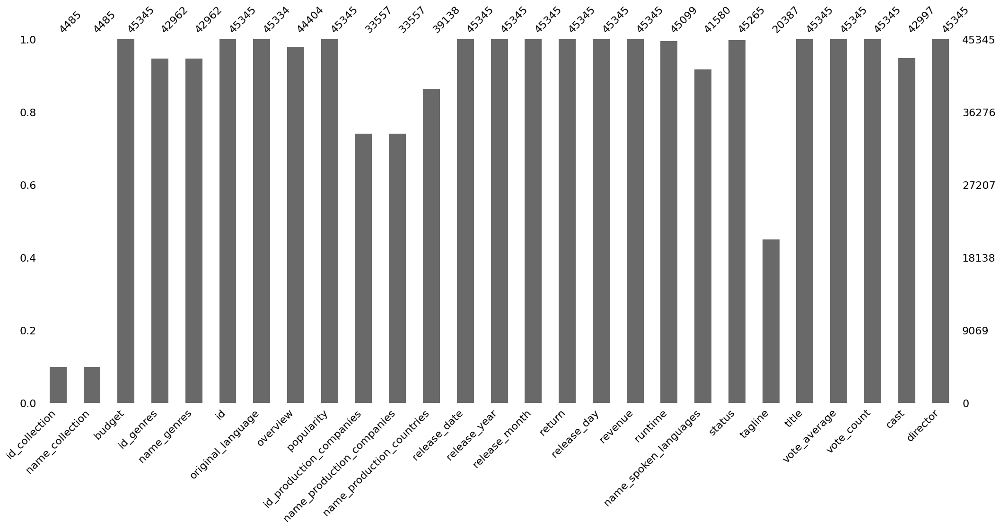

In [10]:
#Deteccion de datos faltantes.
msno.bar(df)

# Por medio de la libreria missingno y un grafico de barras se puede apreciar la cantidad de datos faltantes que se encuentran en varias columnas.

#Interpretacion: En el eje de las "y" tenemos los valores que van de 0 a 1, donde 0 representa el maximo de datos faltantes y 1 representa el minimo de datos faltantes.

<Axes: >

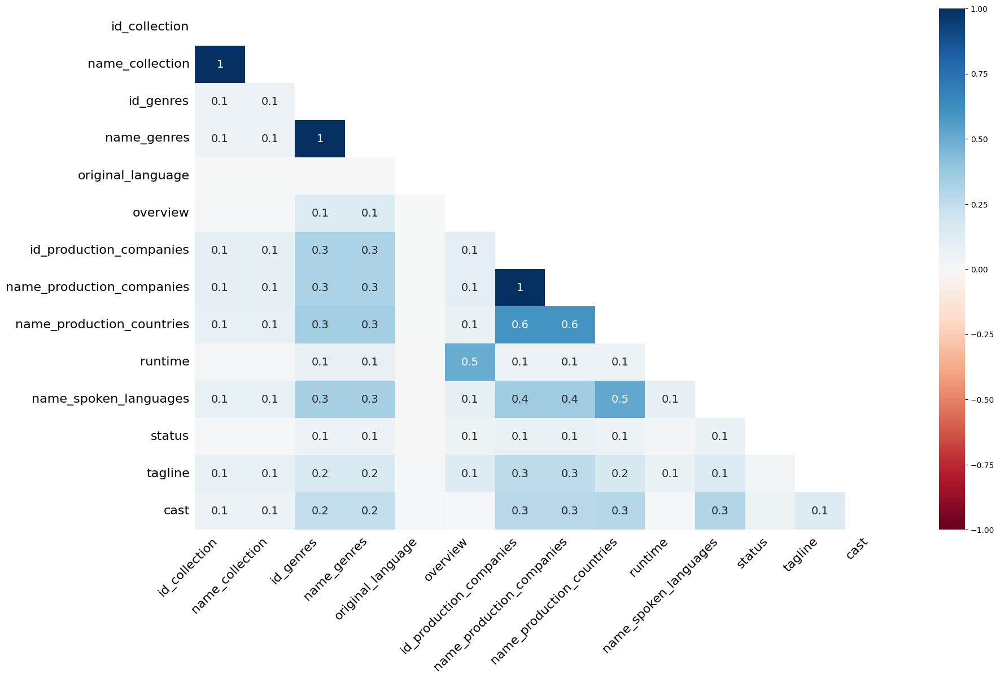

In [11]:
#Heatmap de correlacion de variables que contienen datos Faltantes y definir si el hecho que una tenga datos faltantes significa que otra tambien.
msno.heatmap(df)

#Correlaciones:   
# (Name_collection, id_collection)  
# (name_genres, id_genres)    
# (name_production_countries, id_production_companies) 
# (name_production_countries, name_production_companies)

# Imputacion de datos faltante

Debido a la gran cantidad de datos faltantes en las columnas
* id_collection                40860
* name_collection              40860
* tagline                      24958
* id_production_companies      11788
* name_production_companies    11788

Cuando se tienen grandes cantidades de datos faltantes en una columna se pueden realizar varios procesos para imputar los mismos uno de ellos es utilizar la media (siempre y cuando no se encuentren valores atipicos) y la mas confiable es la mediana, el imputarlos por medio de alguna de estas medidas nos ayuda a tener una columa
mas balanceada, sin embargo en este caso las columnas arriba descritas son columnas que en base a su correlacion y por interpretacion del heatmap se puede evidenciar que si una fue dejada en blanco por consecuencia la otra igual.

Correlaciones:
(Name_collection, id_collection) > 1
(name_genres, id_genres) > 1
(name_production_countries, id_production_companies) > 0.60
(name_production_countries, name_production_companies) > 0.60

De acuerdo a la Correlacion de Pearson mientras un cuadro (del heatmap) se acerque mas al 1 significa que hay mas correlacion lineal, por ende si una sube la otra igual en cambio si es mas cerca -1 significa que si una sube la otra baja.

# Recomendaciones para una mejor recoleccion de los datos:
* Implementar validacion de datos al momento del ingreso del mismo en la base de datos.
* Para que un nuevo registro sea agregado todos los campos deben estar completos.

In [12]:
#Procedemos a eliminar las columnas que poseen la mayor cantidad de nulos con un minimo de 25%. 
#Sin embargo las mismas seran guardadas en otro df en caso de necesitarse o analizarse por separado.
faltantes = df[["id_collection", "name_collection", "tagline", "id_production_companies", "name_production_companies", "id_genres"]]

In [13]:
#Procedemos a eliminar las columnas que poseen la mayor cantidad de nulos con un minimo de 25%. 
df.drop(labels=["id_collection", "name_collection", "tagline", "id_production_companies", "name_production_companies", "id_genres"], axis=1, inplace=True)

In [14]:
#Verificamos el dataframe
df.isnull().sum().sort_values(ascending=False)/len(df)*100

#Ahora la columna que tiene mas valores nulos solo tiene un 13% de su data completa, por ende procederemos a generar los graficos para encontrar patrones, insights o 
#cualquier informacion valiosa para nuestro EDA.

name_production_countries    13.688389
name_spoken_languages         8.303010
name_genres                   5.255265
cast                          5.178079
overview                      2.075201
runtime                       0.542507
status                        0.176425
original_language             0.024258
budget                        0.000000
vote_count                    0.000000
vote_average                  0.000000
title                         0.000000
return                        0.000000
revenue                       0.000000
release_day                   0.000000
release_month                 0.000000
release_year                  0.000000
release_date                  0.000000
popularity                    0.000000
id                            0.000000
director                      0.000000
dtype: float64

# Cambio de Dtypes

In [15]:
# Realizamos el cambio de dtype en las variables que lo necesiten
df.release_month = df.release_month.astype(str)
df.release_day = df.release_day.astype(str)
df.release_day = df.release_day.astype('category')
df.release_month = df.release_month.astype('category')
df.cast = df.cast.astype(str)
df.name_genres = df.name_genres.astype(str)
df.budget = df.budget.astype(int)

# Reporte Pandas Profilling

In [16]:
reporte = ProfileReport(df)
reporte

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Analisis Univariable - Cualitativas

En este apartado tomaremos las variables cualitativas para obtener informacion importante sin embargo para ello tomaremos solo el top 5 de cada variable para obtener un insight que podria ayudarnos a ver con un poco mas de claridad cual es el valor predominante en cada una de ellas.

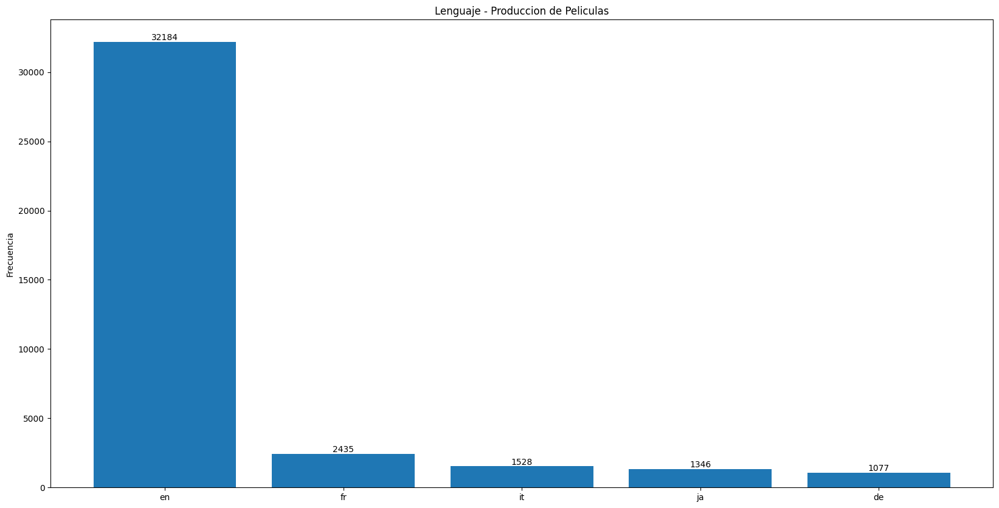

Insights:
* Observando el grafico podemos apreciar que la mayoria de las peliculas fueron grabadas en idioma (en, ingles) con una cantidad de 32184 lo que representa un 71.0% del
  total de lenguajes hablados en peliculas filmadas


In [17]:
#Contamos:
conteo = df.original_language.value_counts()[0:5]

#Porcentaje:
lenguaje = conteo/len(df.original_language)

#Creamos la figura y ejes:
f, ax = plt.subplots(figsize=(20,10))
ax.bar(conteo.index, conteo.values)
ax.set_ylabel("Frecuencia")
ax.set_title("Lenguaje - Produccion de Peliculas")

#Iteramos para poner etiquetas:
for ind, val in enumerate(conteo):
    plt.text(ind, val, str(val), ha="center", va="bottom")
plt.show()

print(f'Insights:\n* Observando el grafico podemos apreciar que la mayoria de las peliculas fueron grabadas en idioma ({conteo.index[0]}, ingles) con una cantidad de {conteo.values[0]} lo que representa un {round(lenguaje[0],2)*100}% del\n  total de lenguajes hablados en peliculas filmadas') 

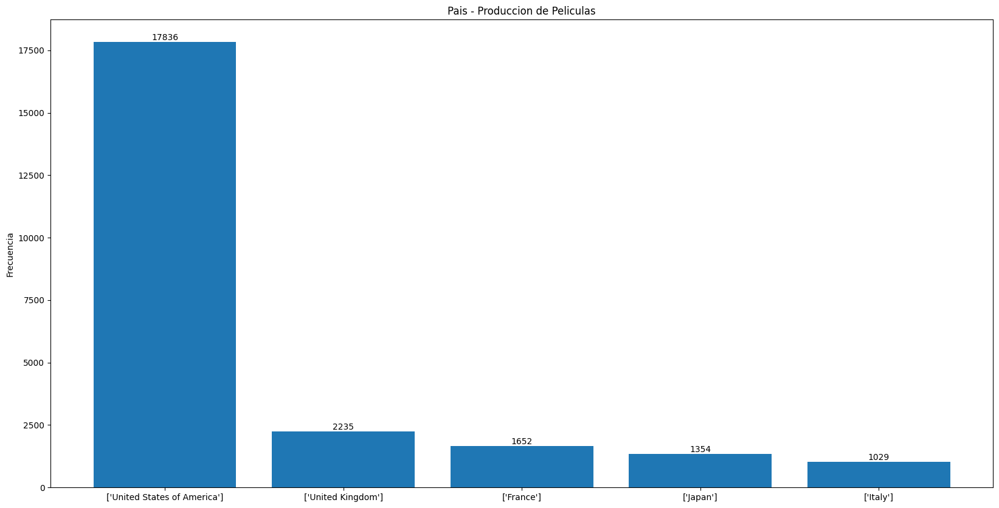

Insights:
* Observando el grafico podemos apreciar que la mayoria de las peliculas fueron grabadas en ['United States of America'] con una cantidad de 17836 lo que representa un 39.0%
  del total de paises que produjeron peliculas.


In [18]:
#Contamos:
conteo = df.name_production_countries.value_counts()[0:5]

#Porcentaje:
paises = conteo/len(df.name_production_countries)

#Creamos la figura y ejes:
f, ax = plt.subplots(figsize=(20,10))
ax.bar(conteo.index, conteo.values)
ax.set_ylabel("Frecuencia")
ax.set_title("Pais - Produccion de Peliculas")
ax.tick_params(axis="x")

#Iteramos para poner etiquetas:
for ind, val in enumerate(conteo):
    plt.text(ind, val, str(val), ha="center", va="bottom")

plt.show()
    
print(f'Insights:\n* Observando el grafico podemos apreciar que la mayoria de las peliculas fueron grabadas en {str(conteo.index[0])} con una cantidad de {conteo.values[0]} lo que representa un {round(paises[0],2)*100}%\n  del total de paises que produjeron peliculas.') 

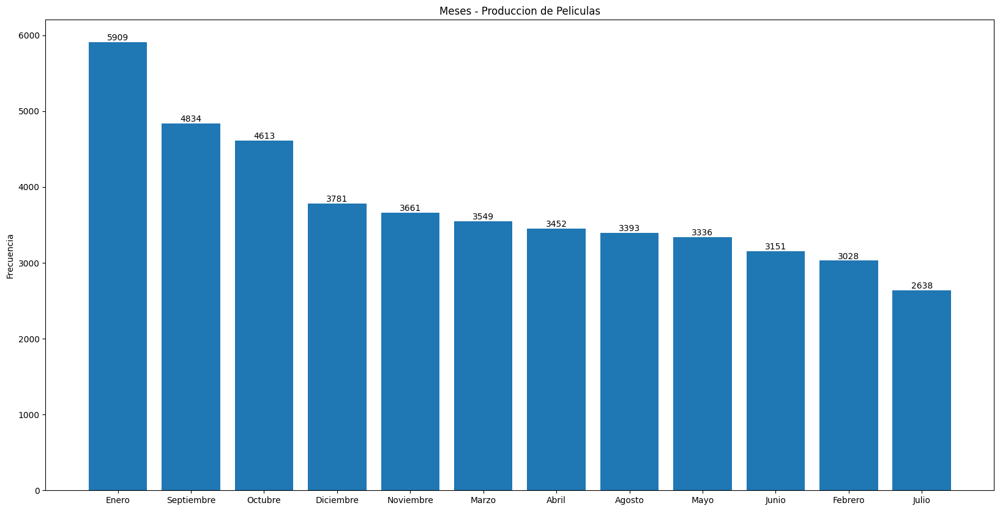

Insights:
* Observando el grafico podemos apreciar que la mayoria de las peliculas fueron estrenadas en el mes de Enero  con una cantidad de 5909 lo que representa un 13.0%
  del total de paises que produjeron peliculas
* Convirtiendo la variable "release_month" a categorica podemos obtener los "codes" y por los mismos saber la desviacion standar la cual es 15.41% y nos indica que no existe
  tanta variacion entre un mes y otro , por ende es relativamente baja.


In [19]:
#Contamos:
conteo = df.release_month.value_counts()

#Porcentaje:
meses = conteo/len(df.release_month)

#Creamos la figura y ejes:
f, ax = plt.subplots(figsize=(20,10))
ax.bar(conteo.index, conteo.values)
ax.set_ylabel("Frecuencia")
ax.set_title("Meses - Produccion de Peliculas")
ax.tick_params(axis="x")

#Iteramos para poner etiquetas:
for ind, val in enumerate(conteo):
    plt.text(ind, val, str(val), ha="center", va="bottom")
plt.show()

print(f'Insights:\n* Observando el grafico podemos apreciar que la mayoria de las peliculas fueron estrenadas en el mes de {(conteo.index[0])}  con una cantidad de {conteo.values[0]} lo que representa un {round(meses[0],2)*100}%\n  del total de paises que produjeron peliculas\n* Convirtiendo la variable "release_month" a categorica podemos obtener los "codes" y por los mismos saber la desviacion standar la cual es 15.41% y nos indica que no existe\n  tanta variacion entre un mes y otro , por ende es relativamente baja.')

In [20]:
#Vemos el describe de la variable categorica release_month
df.release_month.cat.codes.value_counts().describe()

count      12.000000
mean     3778.750000
std       910.781295
min      2638.000000
25%      3289.750000
50%      3500.500000
75%      3989.000000
max      5909.000000
dtype: float64

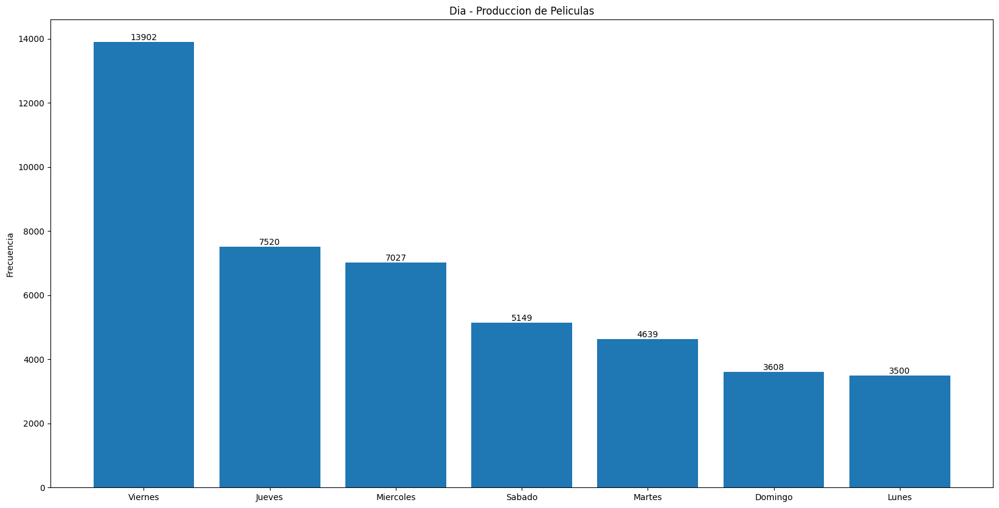

Insights:
* Observando el grafico podemos apreciar que la mayoria de las peliculas fueron estrenadas los dias Viernes con una cantidad de 13902 lo que representa un 31.0%
  del total de paises que produjeron peliculas.
* Al observar que el dia en que mas se estrenan peliculas es el Viernes encontramos que es un dia que tiene mucho sentido ¿Porque? Debido a que es fin de semana
  y por ende son 3 dias seguidos donde la mayorias de las personas estan libres en comparacion a un lunes donde una gran parte se encuentra laborando. 


In [21]:
#Contamos:
conteo = df.release_day.value_counts()

#Porcentaje:
dia = conteo/len(df.original_language)

#Creamos la figura y ejes:
f, ax = plt.subplots(figsize=(20,10))
ax.bar(conteo.index, conteo.values)
ax.set_ylabel("Frecuencia")
ax.set_title("Dia - Produccion de Peliculas")
ax.tick_params(axis="x")

#Iteramos para poner etiquetas:
for ind, val in enumerate(conteo):
    plt.text(ind, val, str(val), ha="center", va="bottom")

plt.show()
    
print(f'Insights:\n* Observando el grafico podemos apreciar que la mayoria de las peliculas fueron estrenadas los dias {str(conteo.index[0])} con una cantidad de {conteo.values[0]} lo que representa un {round(dia[0],2)*100}%\n  del total de paises que produjeron peliculas.\n* Al observar que el dia en que mas se estrenan peliculas es el {conteo.index[0]} encontramos que es un dia que tiene mucho sentido ¿Porque? Debido a que es fin de semana\n  y por ende son 3 dias seguidos donde la mayorias de las personas estan libres en comparacion a un lunes donde una gran parte se encuentra laborando. ') 

In [22]:
#Vemos el describe de la variable categorica release_day
df.release_day.cat.codes.value_counts().describe()

count        7.000000
mean      6477.857143
std       3622.993395
min       3500.000000
25%       4123.500000
50%       5149.000000
75%       7273.500000
max      13902.000000
dtype: float64

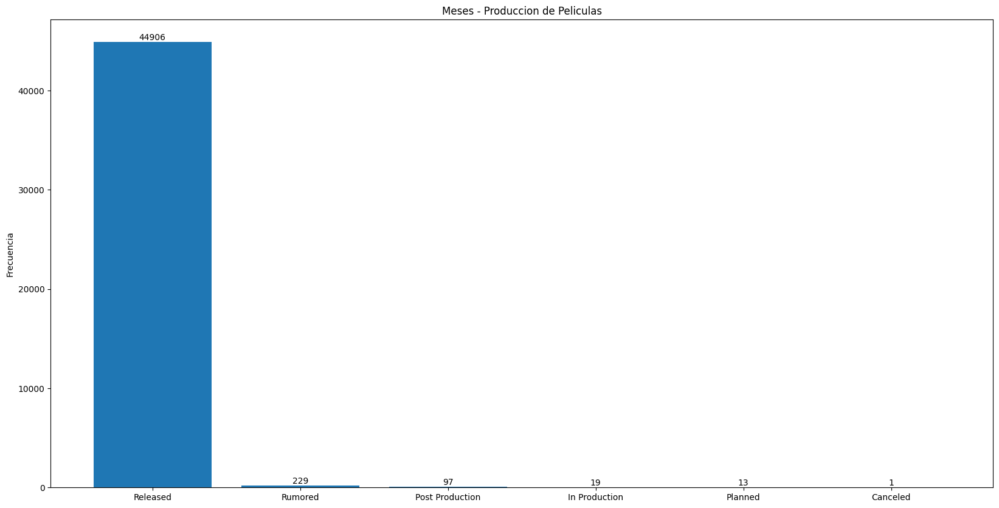

Insights:
* Observando el grafico podemos apreciar que la mayoria de las peliculas fueron "estrenadas" con una cantidad de 44906 lo que representa un 99.0%
  del total de peliculas


In [23]:
#Contamos:
conteo = df.status.value_counts()

#Porcentaje:
status = conteo/len(df.status)

#Creamos la figura y ejes:
f, ax = plt.subplots(figsize=(20,10))
ax.bar(conteo.index, conteo.values)
ax.set_ylabel("Frecuencia")
ax.set_title("Meses - Produccion de Peliculas")
ax.tick_params(axis="x")

#Iteramos para poner etiquetas:
for ind, val in enumerate(conteo):
    plt.text(ind, val, str(val), ha="center", va="bottom")
plt.show()

print(f'Insights:\n* Observando el grafico podemos apreciar que la mayoria de las peliculas fueron "estrenadas" con una cantidad de {conteo.values[0]} lo que representa un {round(status[0],2)*100}%\n  del total de peliculas')

# WordCloud - name_genres, title, cast, director 

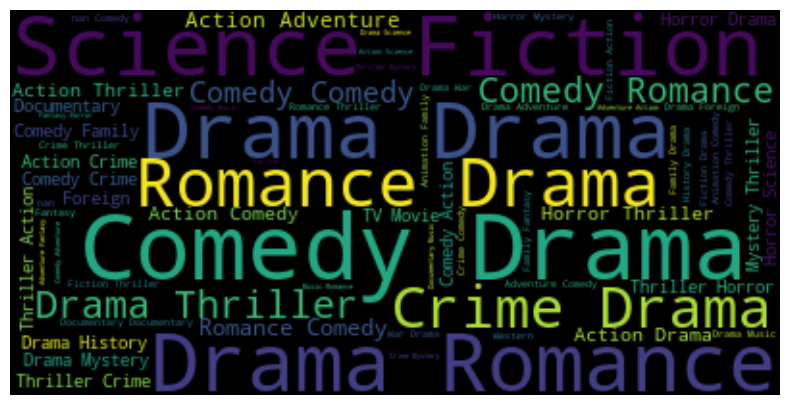

Insights:
* A simple vista podemos observar que las palabras que mas se repiten en los genres son: Drama, Comedy, Romance, Science Fiction. ¿Que significa? Que existe una gran de peliculas que en su genres posee al menos una
  de las 4 palabras antes mencionadas.


In [24]:
#Creamos una lista y la poblamos con las palabras
listaGenres = []
for elemento in df.name_genres:
    listaGenres.append(elemento)

#Hacemos la union de cada palabra, para convertirla a un str
listaGenres = " ".join(listaGenres)
listaGenres = listaGenres.replace("'", "")

#Generamos el wordcloud
wordcloud = WordCloud().generate(listaGenres)

#Creamos la figura:
plt.figure(figsize=(10,5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

print(f"Insights:\n* A simple vista podemos observar que las palabras que mas se repiten en los genres son: Drama, Comedy, Romance, Science Fiction. ¿Que significa? Que existe una gran de peliculas que en su genres posee al menos una\n  de las 4 palabras antes mencionadas.")

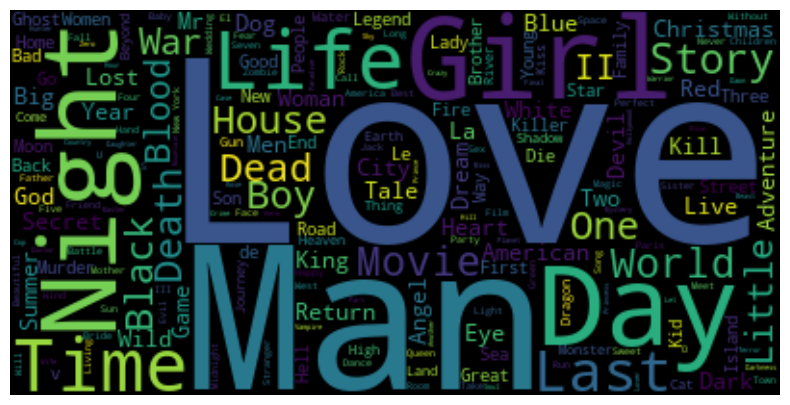

Insights:
* A simple vista podemos observar que las palabras que mas se repiten en los titulos son: Love, Night, Man, Day, Girl. ¿Que significa? Que una gran cantidad de titulos posee al menos una de las 5 palabras antes mencionadas.


In [25]:
#Creamos una lista y la poblamos con las palabras
listaTitulos = []
for elemento in df.title:
    listaTitulos.append(elemento)

#Hacemos la union de cada palabra, para convertirla a un str
listaTitulos = " ".join(listaTitulos)

#Generamos el wordcloud
wordcloud = WordCloud().generate(listaTitulos)

#Creamos la figura:
plt.figure(figsize=(10,5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

print(f"Insights:\n* A simple vista podemos observar que las palabras que mas se repiten en los titulos son: Love, Night, Man, Day, Girl. ¿Que significa? Que una gran cantidad de titulos posee al menos una de las 5 palabras antes mencionadas.")

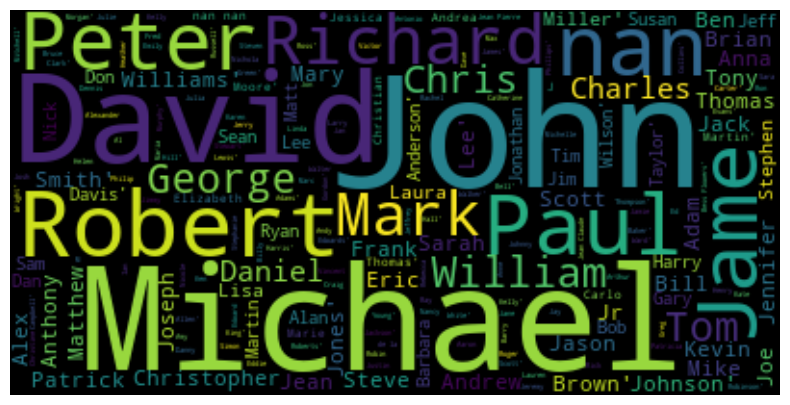

Insights:
* A simple vista podemos observar que los nombres que mas se repiten en los actores son: John, Robert, David, Michael. ¿Que significa? Que una gran cantidad de personas posee al menos uno de los 4 nombres antes
  mencionadas.


In [26]:
#Creamos una lista y la poblamos con las palbras
listaCast = []
for elemento in df.cast:
    listaCast.append(elemento)


#Hacemos la union de cada palabra, para convertirla a un str
listaCast = " ".join(listaCast)

#Generamos el wordcloud
wordcloud = WordCloud().generate(listaCast)

#Creamos la figura:
plt.figure(figsize=(10,5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

print(f"Insights:\n* A simple vista podemos observar que los nombres que mas se repiten en los actores son: John, Robert, David, Michael. ¿Que significa? Que una gran cantidad de personas posee al menos uno de los 4 nombres antes\n  mencionadas.")

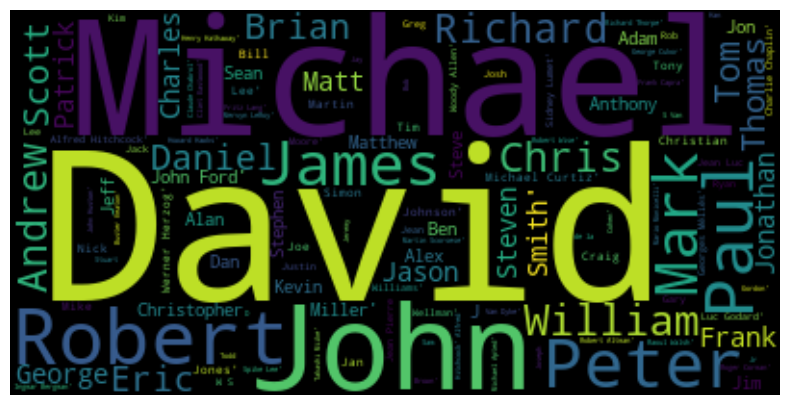

Insights:
* A simple vista podemos observar que las nombres que mas se repiten en los directores son: John, Robert, David, Michael. ¿Que significa? Que una gran cantidad de personas posee al menos uno de los 4 nombres antes
  mencionadas.
* Tanto en los actores como directores los nombres tienen una gran coincidencia entre uno y otro por ende podriamos decir los nombres David, Michael, John son muy comunes. 


In [27]:
#Creamos una lista y la poblamos con las palbras
listaDirector = []
for elemento in df.director:
    listaDirector.append(elemento)


#Hacemos la union de cada palabra, para convertirla a un str
listaDirector = " ".join(listaDirector)

#Generamos el wordcloud
wordcloud = WordCloud().generate(listaDirector)

#Creamos la figura:
plt.figure(figsize=(10,5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

print(f"Insights:\n* A simple vista podemos observar que las nombres que mas se repiten en los directores son: John, Robert, David, Michael. ¿Que significa? Que una gran cantidad de personas posee al menos uno de los 4 nombres antes\n  mencionadas.\n* Tanto en los actores como directores los nombres tienen una gran coincidencia entre uno y otro por ende podriamos decir los nombres David, Michael, John son muy comunes. ")

# Analisis Univariable - Cuantitativo

* Budget

In [28]:
df.budget.describe()

print(f"Ingishts:\n* Por medio del describe vemos que tenemos datos atipicos que estan en negativo.\n* Procederemos a cambiar los datos que tengan '-' para reemplazarlos y asi tener datos que concuerdan con budget")

Ingishts:
* Por medio del describe vemos que tenemos datos atipicos que estan en negativo.
* Procederemos a cambiar los datos que tengan '-' para reemplazarlos y asi tener datos que concuerdan con budget


In [29]:
#Obtenemos los index que tengan error
error = df[df["budget"]<0].index

#Creamos un df de solo los errores
error = df.budget[error]

#Contamos los valores
error.value_counts()

#Cambiamos los valores
df.budget.replace({-1794967296: 1794967296, -2044967296: 2044967296, -1694967296: 1694967296,-1844967296: 1844967296,-1594967296: 1594967296, -1714967296: 1714967296,  -1294967296: 1294967296, -1924967296: 1924967296, -494967296: 494967296, -2094967296: 2094967296, -2144967296: 2144967296, -1744967296: 1744967296,-1494967296: 1494967296, -1994967296: 1994967296}, inplace=True)

# Analisis Bivariable

Para obtener mejores datos mas interpretables y reales (para este ejercicio) realizaremos las siguientes transformaciones:
* Las variables budget, revenue se procede a crear un nuevo dataframe solo para poder obtener informacion de aquellas peliculas que tuvieron un budget y revenue mayor a 0.
* Se procedera a crear variables agrupadas para obtener lineas que puedan integrar varios graficos.

In [30]:
#Creamos una copia
df_transformado = df.copy()
#Nos quedamos solo con las filas en budget y revenue que sean mayores a 0
# df_transformado = df_transformado[(df_transformado["budget"] > 0) & (df_transformado["revenue"]>0)]
#Transformamos a una escala de medicion mas entendible
df_transformado["budget"] = df_transformado["budget"]/1000000
df_transformado["revenue"] = df_transformado["revenue"]/1000000
df_transformado["return"] = df_transformado["revenue"] / df_transformado["budget"]

* Budget vs Revenue en el tiempo (Años)

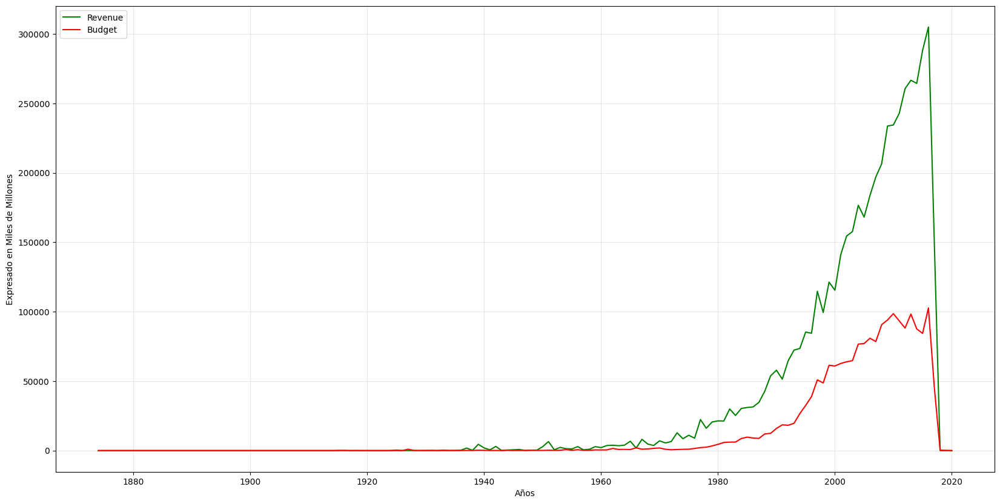

Insights:
* A simple vista podemos observar que el revenue siempre fue mas alto que el budget de produccion.
* Desde el Año 2000 hasta el 2018 la brecha entre el revenue y el budget se agrada de una forma considerable


In [31]:
#Creamos la figura y los ejes
f, ax = plt.subplots(figsize=(20,10))

#Damos forma a nuestro grafico y personalizamos
ax.plot(df_transformado.groupby("release_year")["revenue"].sum(), color="green")
ax.plot(df_transformado.groupby("release_year")["budget"].sum(), color="red")
ax.legend(labels=["Revenue", "Budget"])
ax.set_ylabel("Expresado en Miles de Millones")
ax.set_xlabel("Años")
ax.grid(visible=True, alpha=0.3)
plt.show()
print(f"Insights:\n* A simple vista podemos observar que el revenue siempre fue mas alto que el budget de produccion.\n* Desde el Año 1980 hasta el 2018 la brecha entre el revenue y el budget se empieza a agrandar en formar gradual")